In [364]:
%matplotlib inline

In [365]:
import numpy as np
import random as py_random
import numpy.random as np_random
import time
import matplotlib.pyplot as plt
import matplotlib
from __future__ import division
import pandas as pd
from sklearn import tree
import pydotplus 
from IPython.display import Image
from sklearn.cross_validation import KFold
import sklearn.linear_model as linear
from  sklearn.ensemble import RandomForestClassifier

def bootstrap_lm( formula, data=None, samples=100):
    if data is None:
        raise ValueError( "The parameter 'data' must be assigned a non-nil reference to a Pandas DataFrame")
    
    bootstrap_results = {}
    bootstrap_results[ "formula"] = formula

    variables = map( lambda x: x.strip(), formula.split("~")[1].split( "+"))
    variables = ["intercept"] + variables
    bootstrap_results[ "variables"] = variables
    
    coeffs = []
    sigmas = []
    rs = []

    n = data.shape[ 0]
    bootstrap_results[ "n"] = n
    
    for i in xrange( samples):
        sampling_indices = [ i for i in [py_random.randint(0, n - 1) for _ in xrange( 0, n)]]
        sampling = data.loc[ sampling_indices]
        
        re = lm( formula, data=sampling)
        coeffs.append( re[ "coefficients"])
        sigmas.append( re[ "sigma"])
        rs.append( re[ "r^2"])
    
    coeffs = pd.DataFrame( coeffs, columns=variables)
    sigmas = pd.Series( sigmas, name="sigma")
    rs = pd.Series( rs, name="r^2")

    bootstrap_results[ "resampled_coefficients"] = coeffs
    bootstrap_results[ "resampled_sigma"] = sigmas
    bootstrap_results[ "resampled_r^2"] = rs

    result = lm( formula, data=data)
    
    bootstrap_results[ "residuals"] = result[ "residuals"]
    bootstrap_results[ "coefficients"] = result[ "coefficients"]
    bootstrap_results[ "sigma"] = result[ "sigma"]
    bootstrap_results[ "r^2"] = result[ "r^2"]
    return bootstrap_results

def describe_bootstrap_fit( result):
    print "regression: ", result[ "formula"]
    print "n: ", result[ "n"]
    print "----------"
    
    
    bounds = result[ "resampled_coefficients"].quantile([0.025, 0.975])
    bounds = bounds.transpose()
    bounds = bounds.values.tolist()

    for variable, coefficient, bound in zip( result[ "variables"], result["coefficients"], bounds):
        print variable + ": ", coefficient, bound
    print "----------"
    
    sigma_bounds = stats.mstats.mquantiles( result[ "resampled_sigma"], [0.025, 0.975])
    print "sigma", result[ "sigma"], sigma_bounds

    r_bounds = stats.mstats.mquantiles( result[ "resampled_r^2"], [0.025, 0.975])
    print "R^2", result[ "r^2"], r_bounds

# Module 11 Lab - Rule Based Machine Learning

## Directions

1. Show all work/steps/calculations. If it is easier to write it out by hand, do so and submit a scanned PDF in addition to this notebook. Otherwise, generate a Markdown cell for each answer.
2. You must submit to **two** places by the deadline:
    1. In the Lab section of the Course Module where you downloaded this file from, and
    2. In your Lab Discussion Group, in the forum for the appropriate Module.
3. You may use any core Python libraries or Numpy/Scipy. **Additionally, code from the Module notebooks and lectures is fair to use and modify.** You may also consult Stackoverflow (SO). If you use something from SO, please place a comment with the URL to document the code.

We talked about a wide variety of algorithms this module but we're going to concentrate on just two: Decision Trees and Random Forests.

**Problem 1.**

Decision Trees create a model based on rules. Your main goal for your experiments in this Lab is to explore here is when does this approach work well and when does it fail. Concentrating on classification, some points to consider are:

1. If you wrote out a Decision Tree, and generated data from it, does CART (the algorithm used in `scikit-learn`) recover it?
2. What does it mean for a leaf to be heterogenous (impure) or homogenous (pure) in terms of missing variables (known unknowns and unknown unknowns)? How can you factor that into creating data and regenerating the tree?
3. Does the distribution of class labels or specific examples of class labels change the result?
4. How do you factor in numerical inputs? What happens if you add an "oblique" relationship?

First, let's try to recover a random dataset I thought up. This dataset characterizes how English soccer play the game and whether or not they finish in the top half or the bottom half of the their league. The attributes are: 'Promoted' (was this team promoted to the league from a lower league? True or false), 'Target Man' (Does the team play with a tall, strong central forward who wins aerial duels and bullies defenders? True or false), 'Set Positions' (Does these team have concrete positions or are they encouraged to interchange positions to confuse defenses? True or false), 'Defensive Press' (When this team loses the ball do they immediately try to win the ball back or do they allow the other team space and wait for them to make a mistake? Their can be a high, medium or low press), 'Build Up Speed' (How quickly does this team try to create scoring chances?  Teams can have fast, medium or slow build up speed).

The decision tree I'm going to try to recover is below:

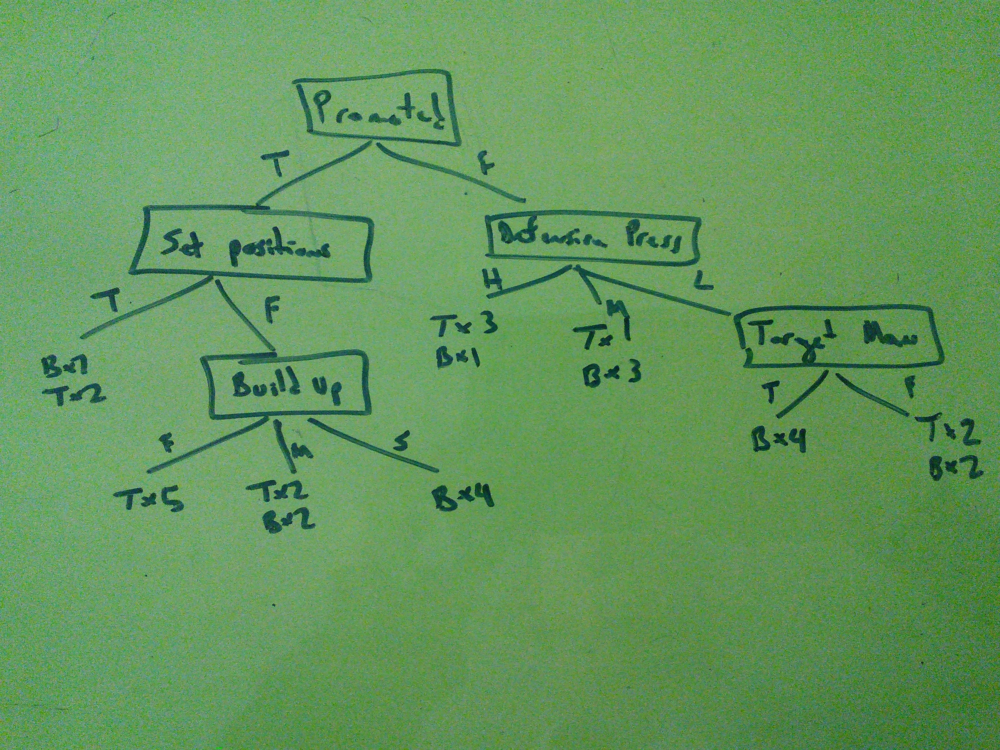

In [366]:
Image('sample_tree.jpg')

In [367]:
# Create data
np.random.seed(314)
py_random.seed(314)

# Leaf-most leaf node
instances = list()
for idx in xrange(9):
    # 'Promoted' = true, 'Set positions' = true
    instance = [1, 1]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,3,2))
    instance.extend(np.random.randint(0,2,1))
    # Set class label, 0 = bottom half of the table, 1 = top
    if idx < 7:
        instance.append(0)
    else:
        instance.append(1)
    instances.append(instance)
    
# Next leaf node to the right
for idx in xrange(5):
    # 'Promoted' = true, 'Set positions' = false, 'Build Up' = Fast
    instance = [1, 0, 2]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,3,1))
    instance.extend(np.random.randint(0,2,1))
    # Set class label, 0 = bottom half of the table, 1 = top
    instance.append(1)
    instances.append(instance)
    
# Next leaf node to the right
for idx in xrange(4):
    # 'Promoted' = true, 'Set positions' = false, 'Build Up' = Medium
    instance = [1, 0, 1]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,3,1))
    instance.extend(np.random.randint(0,2,1))
    # Set class label, 0 = bottom half of the table, 1 = top
    if idx < 2:
        instance.append(1)
    else:
        instance.append(0)
    instances.append(instance)
    
# Next leaf node to the right
for idx in xrange(4):
    # 'Promoted' = true, 'Set positions' = false, 'Build Up' = Slow
    instance = [1, 0, 0]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,3,1))
    instance.extend(np.random.randint(0,2,1))
    # Set class label, 0 = bottom half of the table, 1 = top
    instance.append(0)
    instances.append(instance)
    
# Next leaf node to the right
for idx in xrange(4):
    # 'Promoted' = false, 'Defensive Press' = High
    instance = [0]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,2,1))
    instance.extend(np.random.randint(0,3,1))
    instance.append(2)
    instance.extend(np.random.randint(0,2,1))
    # Set class label, 0 = bottom half of the table, 1 = top
    instance.append(1)
    instances.append(instance)
    
# Next leaf node to the right
for idx in xrange(4):
    # 'Promoted' = false, 'Defensive Press' = Medium
    instance = [0]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,2,1))
    instance.extend(np.random.randint(0,3,1))
    instance.append(1)
    instance.extend(np.random.randint(0,2,1))
    # Set class label, 0 = bottom half of the table, 1 = top
    if idx < 1:
        instance.append(1)
    else:
        instance.append(0)
    instances.append(instance)

# Next leaf node to the right
for idx in xrange(4):
    # 'Promoted' = false, 'Defensive Press' = Low
    instance = [0]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,2,1))
    instance.extend(np.random.randint(0,3,1))
    instance.append(0)
    instance.append(1)
    # Set class label, 0 = bottom half of the table, 1 = top
    instance.append(0)
    instances.append(instance)
    
# Next leaf node to the right
for idx in xrange(4):
    # 'Promoted' = false, 'Defensive Press' = Low
    instance = [0]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,2,1))
    instance.extend(np.random.randint(0,3,1))
    instance.append(0)
    instance.append(0)
    # Set class label, 0 = bottom half of the table, 1 = top
    if idx < 2:
        instance.append(0)
    else:
        instance.append(1)
    instances.append(instance)
instances = np.array(instances)

Now that the data is generated, let's learn the decision tree:

In [368]:
clf = tree.DecisionTreeClassifier(min_samples_leaf=4)
clf.fit(instances[:, :-1], instances[:, -1])

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None, min_samples_leaf=4,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            presort=False, random_state=None, splitter='best')

Now, let's print the tree to the screen:

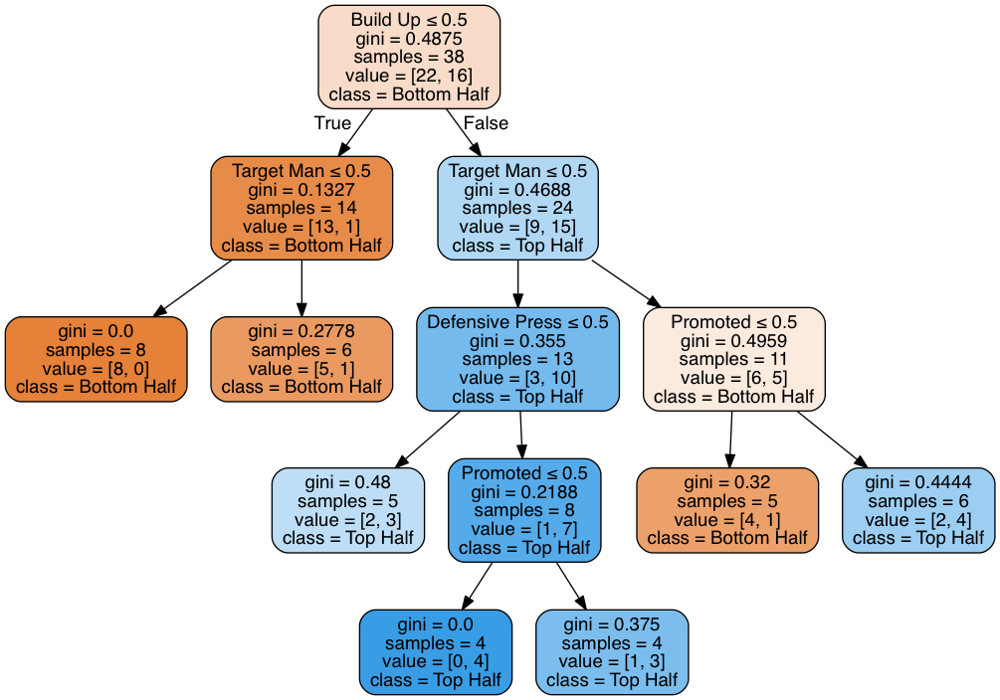

In [369]:
dot_data = tree.export_graphviz(clf, out_file="temp",
                         feature_names=['Promoted','Set Position', 'Build Up', 'Defensive Press', 'Target Man'],  
                         class_names=['Bottom Half', 'Top Half'],  
                         filled=True, rounded=True,  
                         special_characters=True)
with open('temp', 'r') as myfile:
    dot_data=myfile.read().replace('\n', '')
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())  

As can be seen, the learned tree doesn't look anything like the decision tree the data was generated from. This was my hunch before trying. It is likely due to the random 'relationships' that were created when filling in the attributes that were "Don't Cares" when generating the data.

In this next experiment, I want to see how decision trees perform on data that is easily separable by axis-parallel splits and data that needs an oblique decision boundary. First the axis-parallel data:

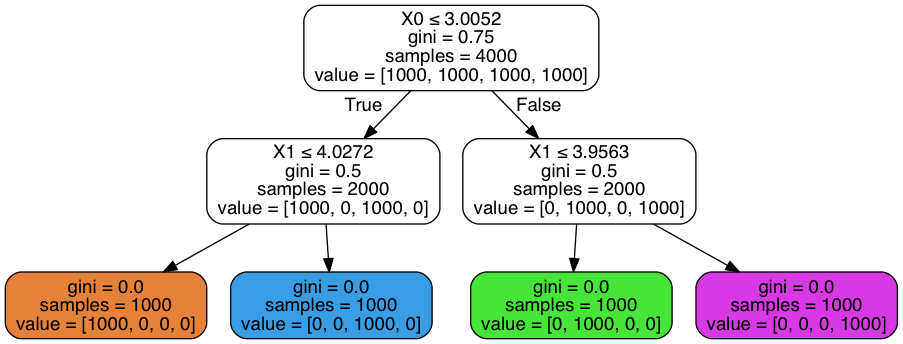

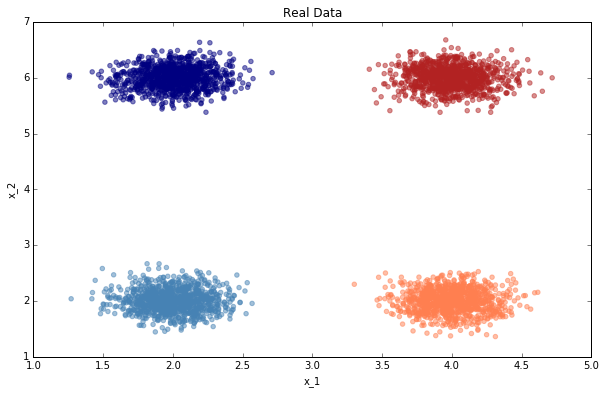

In [370]:
# Create data with 4 clusters
py_random.seed(316000)
np_random.seed(316000)
centers_x1 = [1, 2, 1, 2]
centers_x2 = [1, 1, 3, 3]
x_1 = []
x_2 = []
cluster = 1
colors = []
labels = []
for center_x1, center_x2 in zip(centers_x1, centers_x2):
    x_1.extend(center_x1 + np.random.normal(center_x1, 0.2, 1000))
    x_2.extend(center_x2 + np.random.normal(center_x2, 0.2, 1000))
    if cluster == 1:
        colors.extend(['steelblue'] * 1000)
        labels.extend([1] * 1000)
    elif cluster == 2:
        colors.extend(['coral'] * 1000)
        labels.extend([2] * 1000)
    elif cluster == 3:
        colors.extend(['navy'] * 1000)
        labels.extend([3] * 1000)
    else:
        colors.extend(['firebrick'] * 1000)
        labels.extend([4] * 1000)
    cluster += 1
x_1 = np.array(x_1)
x_2 = np.array(x_2)
labels = np.array(labels)
instances = np.column_stack((x_1.T, x_2.T, labels.T))

# Graph the original data
figure = plt.figure(figsize=(10,6))
axes = figure.add_subplot(1, 1, 1)
axes.scatter(x_1, x_2, alpha=0.5, color=colors)
axes.set_xlabel("x_1")
axes.set_ylabel("x_2")
axes.set_title("Real Data")

# Train the tree
clf = tree.DecisionTreeClassifier()
clf.fit(instances[:, :-1], instances[:, -1])
dot_data = tree.export_graphviz(clf, out_file="temp2",  
                         filled=True, rounded=True,  
                         special_characters=True)
with open('temp2', 'r') as myfile:
    dot_data=myfile.read().replace('\n', '')
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png()) 

As expected, the decision tree learned the data perfectly by first splitting on x_1 around 3 and then x_2 around 4, which aligns with my intuition. This is a oversimplified example but it is helpful in confirming the expect behavior of the learning process. Now let's look at data that needs a oblique decision boundary:

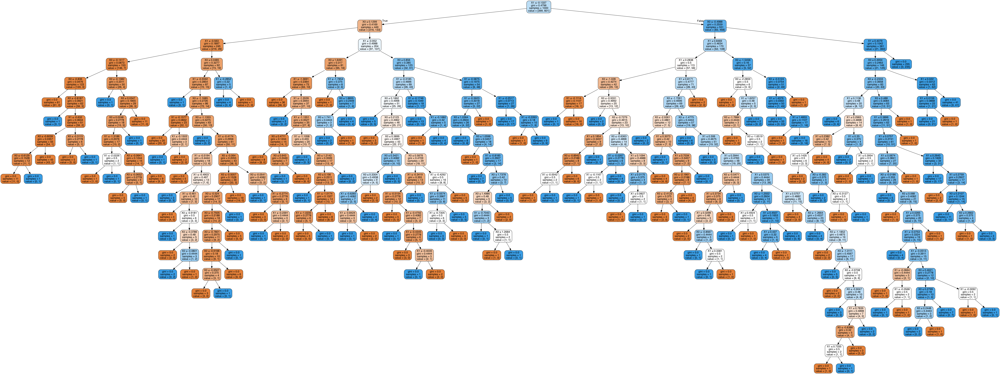

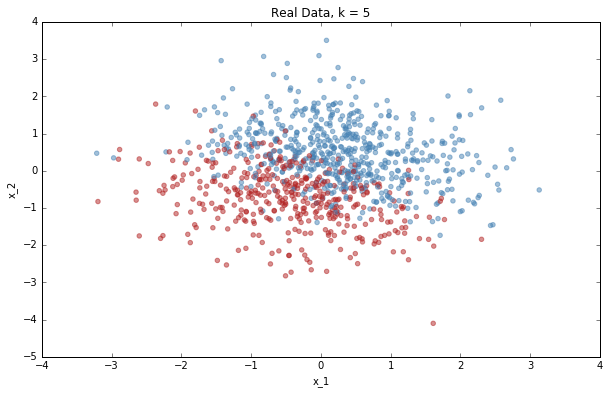

In [371]:
# Create data
py_random.seed(314)
np_random.seed(314)
x_1 = np.random.normal(0, 1, 1000)
x_2 = np.random.normal(0, 1, 1000)
z = 1 + 2 * x_1 + 3 * x_2
pr = 1/(1+np.exp(-z))
y = [1 if py_random.random() < p else 0 for p in pr]
colors = []
for val in y:
    if val == 1:
        colors.append('steelblue')
    else:
        colors.append('firebrick')
        
# Graph the data
figure = plt.figure(figsize=(10,6))
axes = figure.add_subplot(1, 1, 1)
axes.scatter(x_1, x_2, alpha=0.5, color=colors)
axes.set_xlabel("x_1")
axes.set_ylabel("x_2")
axes.set_title("Real Data, k = 5")

# Format data
instances = np.column_stack((x_1, x_2, y))

# Train the tree
clf = tree.DecisionTreeClassifier()
clf.fit(instances[:, :-1], instances[:, -1])
dot_data = tree.export_graphviz(clf, out_file="temp3",  
                         filled=True, rounded=True,  
                         special_characters=True)
with open('temp3', 'r') as myfile:
    dot_data=myfile.read().replace('\n', '')
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())  

As we can see, because the simple linear line decision boundary isn't axis-parallel, the number nodes increases and the depth of the tree expands to 19. This is because this oblique decision boundary has to be estimated with only axis-parallel splits and quite a few axis-parallel splits at that.

Now let's see if class imbalance changes the tree we learned in the first experiment. In the next experiment the class balance is 29 bottom half and 7 top half teams.

In [372]:
# Create imbalanced data
# Leaf-most leaf node
instances = list()
for idx in xrange(9):
    # 'Promoted' = true, 'Set positions' = true
    instance = [1, 1]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,3,2))
    instance.extend(np.random.randint(0,2,1))
    # Set class label, 0 = bottom half of the table, 1 = top
    instance.append(0)
    instances.append(instance)
    
# Next leaf node to the right
for idx in xrange(5):
    # 'Promoted' = true, 'Set positions' = false, 'Build Up' = Fast
    instance = [1, 0, 2]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,3,1))
    instance.extend(np.random.randint(0,2,1))
    # Set class label, 0 = bottom half of the table, 1 = top
    instance.append(1)
    instances.append(instance)
    
# Next leaf node to the right
for idx in xrange(4):
    # 'Promoted' = true, 'Set positions' = false, 'Build Up' = Medium
    instance = [1, 0, 1]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,3,1))
    instance.extend(np.random.randint(0,2,1))
    # Set class label, 0 = bottom half of the table, 1 = top
    instance.append(0)
    instances.append(instance)
    
# Next leaf node to the right
for idx in xrange(4):
    # 'Promoted' = true, 'Set positions' = false, 'Build Up' = Slow
    instance = [1, 0, 0]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,3,1))
    instance.extend(np.random.randint(0,2,1))
    # Set class label, 0 = bottom half of the table, 1 = top
    instance.append(0)
    instances.append(instance)
    
# Next leaf node to the right
for idx in xrange(4):
    # 'Promoted' = false, 'Defensive Press' = High
    instance = [0]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,2,1))
    instance.extend(np.random.randint(0,3,1))
    instance.append(2)
    instance.extend(np.random.randint(0,2,1))
    # Set class label, 0 = bottom half of the table, 1 = top
    instance.append(1)
    instances.append(instance)
    
# Next leaf node to the right
for idx in xrange(4):
    # 'Promoted' = false, 'Defensive Press' = Medium
    instance = [0]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,2,1))
    instance.extend(np.random.randint(0,3,1))
    instance.append(1)
    instance.extend(np.random.randint(0,2,1))
    # Set class label, 0 = bottom half of the table, 1 = top
    instance.append(0)
    instances.append(instance)

# Next leaf node to the right
for idx in xrange(4):
    # 'Promoted' = false, 'Defensive Press' = Low
    instance = [0]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,2,1))
    instance.extend(np.random.randint(0,3,1))
    instance.append(0)
    instance.append(1)
    # Set class label, 0 = bottom half of the table, 1 = top
    instance.append(0)
    instances.append(instance)
    
# Next leaf node to the right
for idx in xrange(4):
    # 'Promoted' = false, 'Defensive Press' = Low
    instance = [0]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,2,1))
    instance.extend(np.random.randint(0,3,1))
    instance.append(0)
    instance.append(0)
    # Set class label, 0 = bottom half of the table, 1 = top
    instance.append(0)
    instances.append(instance)
instances = np.array(instances)

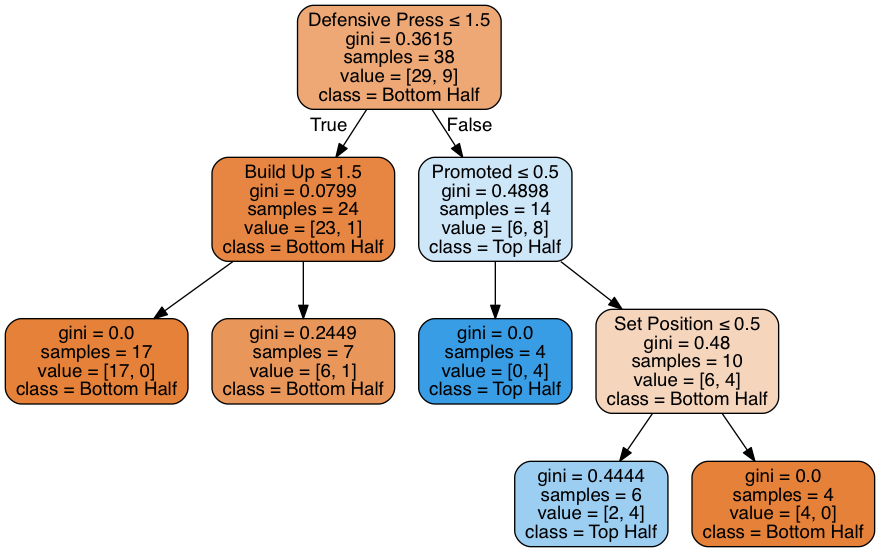

In [373]:
clf = tree.DecisionTreeClassifier(min_samples_leaf=4)
clf.fit(instances[:, :-1], instances[:, -1])
dot_data = tree.export_graphviz(clf, out_file="temp4",
                         feature_names=['Promoted','Set Position', 'Build Up', 'Defensive Press', 'Target Man'],  
                         class_names=['Bottom Half', 'Top Half'],  
                         filled=True, rounded=True,  
                         special_characters=True)
with open('temp4', 'r') as myfile:
    dot_data=myfile.read().replace('\n', '')
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())  

Here's the original tree for reference:

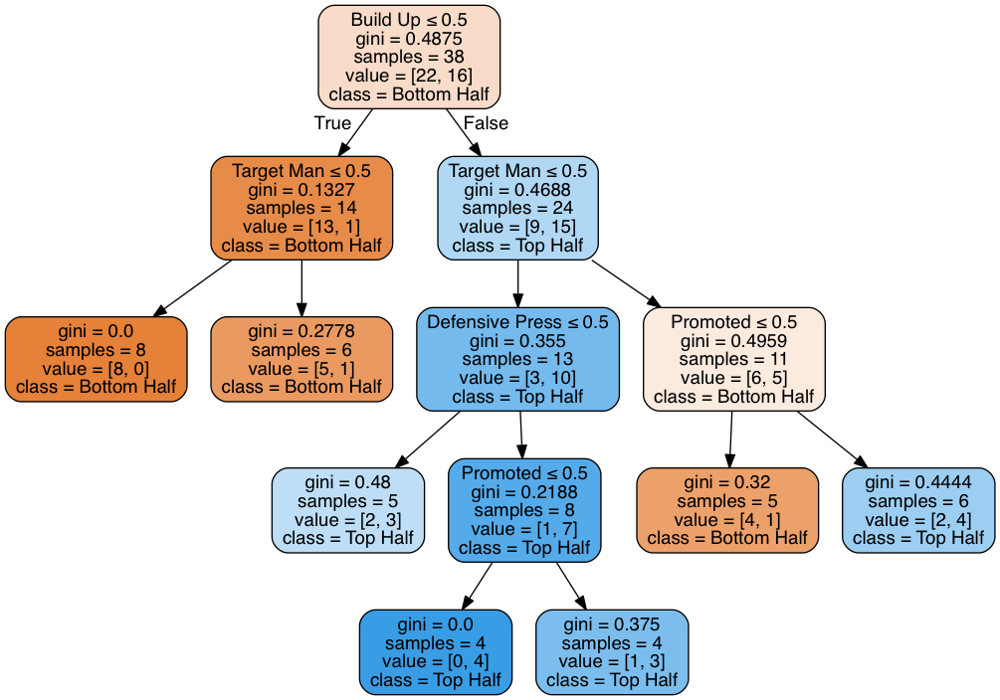

In [374]:
with open('temp', 'r') as myfile:
    dot_data=myfile.read().replace('\n', '')
graph = pydotplus.graph_from_dot_data(dot_data)  
Image(graph.create_png())  

For all intents and purposes, this tree is completely different than the one we just learned. The splitting attribute at each level is different and the depth of the trees are different. In conclusion, class imbalance, or any class structure that changes, have a profound impact on the decision tree that is learned. 

** Problem 2.**

Decision Trees can also be used for regression. Generate data (or use previous data) for several regression problems. Include at least a "vanilla" regression problem, a problem with non-linearities and a problem with "bend". Compare the results with regular linear regression both in terms of accuracy and interpretability.

Let's start by creating a linear dataset and quickly visualization what decision tree regression looks like:

In [375]:
# Create data
np.random.seed(314314)
x_1 = [i for i in xrange(100)]
for i in xrange(70):
    del x_1[np.random.randint(0, len(x_1))]
noise = np.random.normal(0, 30, len(x_1))
x_1 = np.array(x_1)
y = 2.3 + 4.5 * x_1 + noise

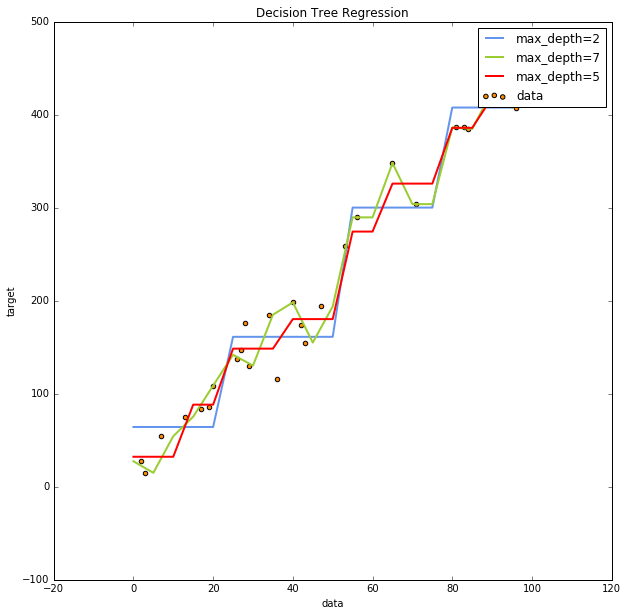

In [376]:
# Format data
instances = np.column_stack((x_1, y))

# Train decision trees
clf = tree.DecisionTreeRegressor(max_depth=2)
clf.fit(instances[:, :-1], instances[:, -1])
X_test = np.array([[i] for i in np.arange(0, 100, 5)])
y_1 = clf.predict(X_test)
clf2 = tree.DecisionTreeRegressor(max_depth=7)
clf2.fit(instances[:, :-1], instances[:, -1])
y_2 = clf2.predict(X_test)
clf3 = tree.DecisionTreeRegressor(max_depth=3)
clf3.fit(instances[:, :-1], instances[:, -1])
y_3 = clf3.predict(X_test)

# Graph the learned tree
plt.figure(figsize=(10,10))
plt.scatter(instances[:, :-1], instances[:, -1], c="darkorange", label="data")
plt.plot(X_test, y_1, color="cornflowerblue", label="max_depth=2", linewidth=2)
plt.plot(X_test, y_2, color="yellowgreen", label="max_depth=7", linewidth=2)
plt.plot(X_test, y_3, color="red", label="max_depth=5", linewidth=2)
plt.xlabel("data")
plt.ylabel("target")
plt.title("Decision Tree Regression")
plt.legend()
plt.show()

Having visualized the data, let's formally test decision tree regression and linear regression on a similar dataset to the last one with 10-fold cross validation:

In [377]:
# Create data
np.random.seed(3143014)
x_1 = [i for i in xrange(10000)]
for i in xrange(9000):
    del x_1[np.random.randint(0, len(x_1))]
noise = np.random.normal(0, 30, len(x_1))
x_1 = np.array(x_1)
y = 2.3 + 4.5 * x_1 + noise
instances = np.column_stack((x_1, y))

In [378]:
# Run 10-fold cross validation with decision-tree regression
# Run 3 rounds of 10-fold cross validation
errors = []
for rd in xrange(3):
    generalization_error = []
    np.random.shuffle(instances)
    kf = KFold(1000, n_folds=10)
    for train, test in kf:
        # Learn linear regression model
        model = tree.DecisionTreeRegressor()
        model.fit(instances[train, :-1], instances[train, -1])
        predictions = model.predict(instances[test, :-1])
        # Calculate number of correct predictions
        error = sum(predictions - instances[test, -1])**2
        generalization_error.append(error)
    errors.append(np.mean(generalization_error))

print "Decision tree regression cross-validation error: %f" % (np.mean(errors))

Decision tree regression cross-validation error: 516109.591807


Now let's compare this performance to linear regression:

In [379]:
errors = []
for rd in xrange(3):
    generalization_error = []
    np.random.shuffle(instances)
    kf = KFold(1000, n_folds=10)
    for train, test in kf:
        # Learn linear regression model
        model = linear.LinearRegression(fit_intercept=False).fit(instances[train, :-1], instances[train, -1])
        model.fit(instances[train, :-1], instances[train, -1])
        predictions = model.predict(instances[test, :-1])
        # Calculate number of correct predictions
        error = sum(predictions - instances[test, -1])**2
        generalization_error.append(error)
    errors.append(np.mean(generalization_error))

print "Linear regression cross-validation error: %f" % (np.mean(errors))

Linear regression cross-validation error: 75379.293927


Clearly, linear regression outperforms decision tree performance for a linear dataset. However, we didn't do anything to prevent the decision tree from over fitting. Let's tune the max depth and minimum examples per leaf node parameters of the tree and see if we can improve performance. First, max depth:

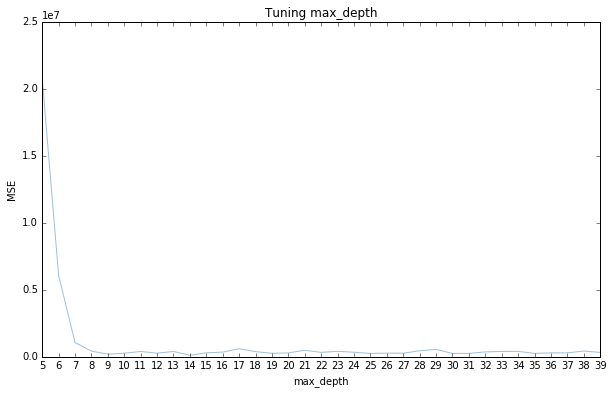

In [380]:
np.random.seed(234)
ys = []
for max_depth in xrange(5, 40):
    errors = []
    for rd in xrange(3):
        generalization_error = []
        np.random.shuffle(instances)
        kf = KFold(1000, n_folds=10)
        for train, test in kf:
            # Learn linear regression model
            model = tree.DecisionTreeRegressor(max_depth=max_depth)
            model.fit(instances[train, :-1], instances[train, -1])
            predictions = model.predict(instances[test, :-1])
            # Calculate number of correct predictions
            error = sum(predictions - instances[test, -1])**2
            generalization_error.append(error)
        errors.append(np.mean(generalization_error))
    #print "Decision tree regression with max deptn = %d cross-validation error: %f" % (max_depth, np.mean(errors))
    ys.append(np.mean(errors))
    
figure = plt.figure(figsize=(10,6))
axes = figure.add_subplot(1, 1, 1)
axes.set_xticks([i for i in xrange(5, 40)])
axes.plot(xrange(5, 40), ys, alpha=0.5, color='steelblue')
axes.set_xlabel("max_depth")
axes.set_ylabel("MSE")
axes.set_title("Tuning max_depth")

The elbow method shows us that max depth = 9 is where performance is best. Next let's tune the minimum amount of examples in a leaf node:

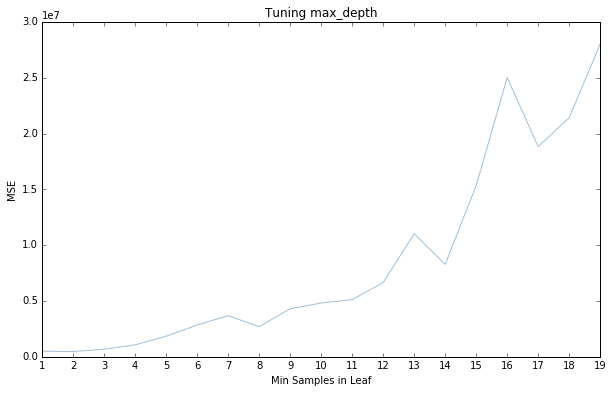

In [381]:
np.random.seed(2034)
ys = []
for min_samples in xrange(1, 20):
    errors = []
    for rd in xrange(3):
        generalization_error = []
        np.random.shuffle(instances)
        kf = KFold(1000, n_folds=10)
        for train, test in kf:
            # Learn linear regression model
            model = tree.DecisionTreeRegressor(min_samples_leaf=min_samples)
            model.fit(instances[train, :-1], instances[train, -1])
            predictions = model.predict(instances[test, :-1])
            # Calculate number of correct predictions
            error = sum(predictions - instances[test, -1])**2
            generalization_error.append(error)
        errors.append(np.mean(generalization_error))
    #print "Decision tree regression with max deptn = %d cross-validation error: %f" % (max_depth, np.mean(errors))
    ys.append(np.mean(errors))
    
figure = plt.figure(figsize=(10,6))
axes = figure.add_subplot(1, 1, 1)
axes.set_xticks([i for i in xrange(1, 20)])
axes.plot(xrange(1, 20), ys, alpha=0.5, color='steelblue')
axes.set_xlabel("Min Samples in Leaf")
axes.set_ylabel("MSE")
axes.set_title("Tuning max_depth")

Here, 1 is the best option. Putting everything together we get:

In [382]:
# Run 10-fold cross validation with decision-tree regression
# Run 3 rounds of 10-fold cross validation
errors = []
for rd in xrange(3):
    generalization_error = []
    np.random.shuffle(instances)
    kf = KFold(1000, n_folds=10)
    for train, test in kf:
        # Learn linear regression model
        model = tree.DecisionTreeRegressor(max_depth=9,min_samples_leaf=1)
        model.fit(instances[train, :-1], instances[train, -1])
        predictions = model.predict(instances[test, :-1])
        # Calculate number of correct predictions
        error = sum(predictions - instances[test, -1])**2
        generalization_error.append(error)
    errors.append(np.mean(generalization_error))

print "Decision tree regression cross-validation error: %f" % (np.mean(errors))

Decision tree regression cross-validation error: 266251.659408


Even after tuning, linear regression performs much better on the linear dataset. In the end, this could be due to affinity decision trees have to overfit, even when some parameters have been tuned for generalization performance.

Next, let's perform the same analysis on a non-linear dataset:

In [383]:
# Create data
np.random.seed(31430414)
rng = np.random.RandomState(1)
x_1 = np.sort(25 * rng.rand(1000, 1), axis=0)
y = np.sin(x_1).ravel()
instances = np.column_stack((x_1, y))

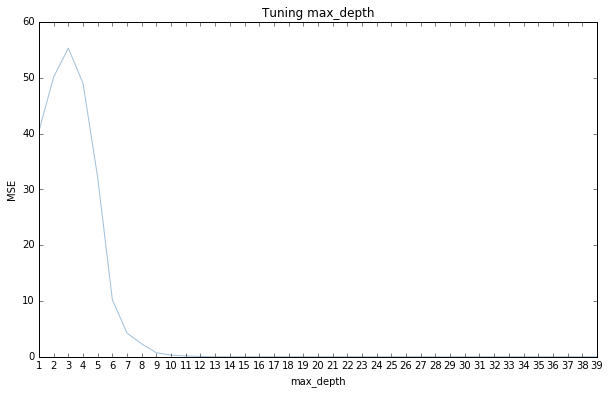

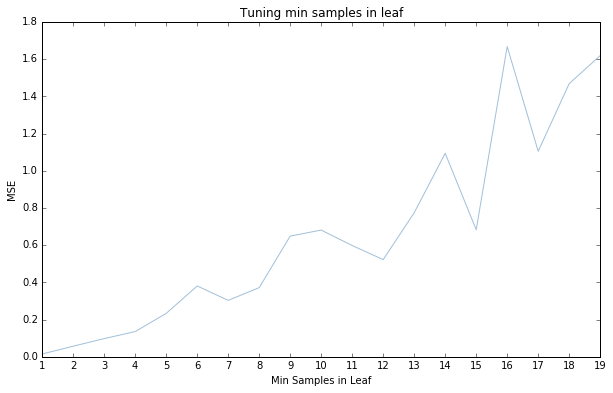

In [384]:
# Tune max_depth
np.random.seed(20034)
ys = []
for max_depth in xrange(1, 40):
    errors = []
    for rd in xrange(3):
        generalization_error = []
        np.random.shuffle(instances)
        kf = KFold(1000, n_folds=10)
        for train, test in kf:
            # Learn linear regression model
            model = tree.DecisionTreeRegressor(max_depth=max_depth)
            model.fit(instances[train, :-1], instances[train, -1])
            predictions = model.predict(instances[test, :-1])
            # Calculate number of correct predictions
            error = sum(predictions - instances[test, -1])**2
            generalization_error.append(error)
        errors.append(np.mean(generalization_error))
    #print "Decision tree regression with max deptn = %d cross-validation error: %f" % (max_depth, np.mean(errors))
    ys.append(np.mean(errors))
    
figure = plt.figure(figsize=(10,6))
axes = figure.add_subplot(1, 1, 1)
axes.set_xticks([i for i in xrange(1, 40)])
axes.plot(xrange(1, 40), ys, alpha=0.5, color='steelblue')
axes.set_xlabel("max_depth")
axes.set_ylabel("MSE")
axes.set_title("Tuning max_depth")

ys = []
for min_samples in xrange(1, 20):
    errors = []
    for rd in xrange(3):
        generalization_error = []
        np.random.shuffle(instances)
        kf = KFold(1000, n_folds=10)
        for train, test in kf:
            # Learn linear regression model
            model = tree.DecisionTreeRegressor(min_samples_leaf=min_samples)
            model.fit(instances[train, :-1], instances[train, -1])
            predictions = model.predict(instances[test, :-1])
            # Calculate number of correct predictions
            error = sum(predictions - instances[test, -1])**2
            generalization_error.append(error)
        errors.append(np.mean(generalization_error))
    #print "Decision tree regression with max deptn = %d cross-validation error: %f" % (max_depth, np.mean(errors))
    ys.append(np.mean(errors))
    
figure = plt.figure(figsize=(10,6))
axes = figure.add_subplot(1, 1, 1)
axes.set_xticks([i for i in xrange(1, 20)])
axes.plot(xrange(1, 20), ys, alpha=0.5, color='steelblue')
axes.set_xlabel("Min Samples in Leaf")
axes.set_ylabel("MSE")
axes.set_title("Tuning min samples in leaf")

In [385]:
# Run 10-fold cross validation with decision-tree regression
# Run 3 rounds of 10-fold cross validation
errors = []
for rd in xrange(3):
    generalization_error = []
    np.random.shuffle(instances)
    kf = KFold(1000, n_folds=10)
    for train, test in kf:
        # Learn linear regression model
        model = tree.DecisionTreeRegressor(max_depth=10, min_samples_leaf=1)
        model.fit(instances[train, :-1], instances[train, -1])
        predictions = model.predict(instances[test, :-1])
        # Calculate number of correct predictions
        error = sum(predictions - instances[test, -1])**2
        generalization_error.append(error)
    errors.append(np.mean(generalization_error))

print "Decision tree regression cross-validation error: %f" % (np.mean(errors))

Decision tree regression cross-validation error: 0.545863


Let's see how linear regression does:

In [386]:
errors = []
for rd in xrange(3):
    generalization_error = []
    np.random.shuffle(instances)
    kf = KFold(1000, n_folds=10)
    for train, test in kf:
        # Learn linear regression model
        model = linear.LinearRegression(fit_intercept=False).fit(instances[train, :-1], instances[train, -1])
        model.fit(instances[train, :-1], instances[train, -1])
        predictions = model.predict(instances[test, :-1])
        # Calculate number of correct predictions
        error = sum(predictions - instances[test, -1])**2
        generalization_error.append(error)
    errors.append(np.mean(generalization_error))

print "Linear regression cross-validation error: %f" % (np.mean(errors))

Linear regression cross-validation error: 95.406873


In this case, decision tree regression easily outperforms linear regression. This doesn't come as a surprise because the area linear regression struggles in, nonlinear regression, is a strong aspect of decision trees. Decision trees are universal function approximators so they can learn linear relationships just as well as non-linear relationships.

Given its strong performance on a sin curve, I'd like to see how noise affects decision trees by visualizing the fits on the data without noise and then with noise.

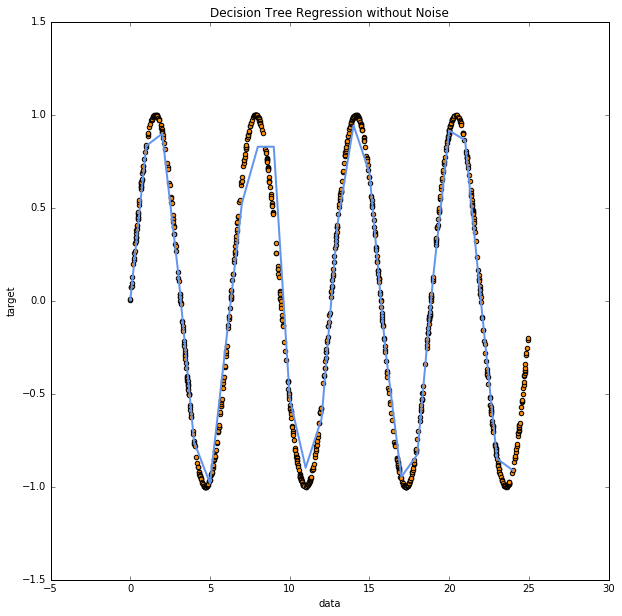

In [387]:
# Create data
np.random.seed(31430414)
rng = np.random.RandomState(1)
x_1 = np.sort(25 * rng.rand(1000, 1), axis=0)
y = np.sin(x_1).ravel()

# Format data
instances = np.column_stack((x_1, y))

# Train decision trees
clf = tree.DecisionTreeRegressor(max_depth=10, min_samples_leaf=1)
clf.fit(instances[:, :-1], instances[:, -1])
X_test = np.array([[i] for i in np.arange(0, max(x_1))])
y_1 = clf.predict(X_test)

# Graph the learned tree
plt.figure(figsize=(10,10))
plt.scatter(instances[:, :-1], instances[:, -1], c="darkorange", label="data")
plt.plot(X_test, y_1, color="cornflowerblue", linewidth=2)
plt.xlabel("data")
plt.ylabel("target")
plt.title("Decision Tree Regression without Noise")
plt.show()

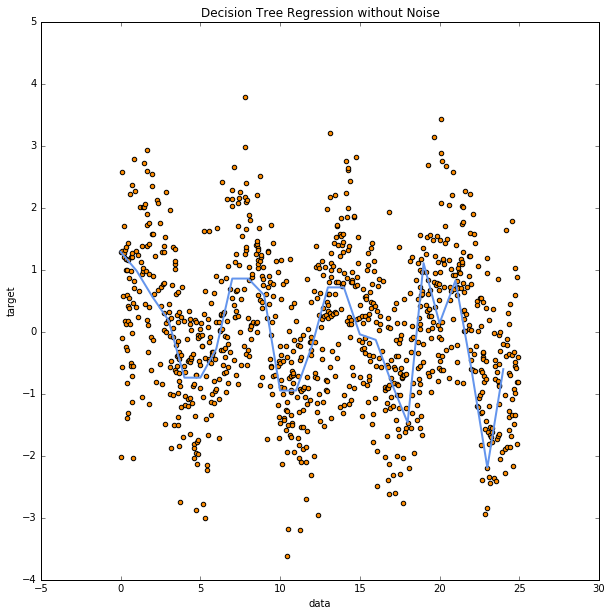

In [388]:
# Create data
np.random.seed(31430414)
rng = np.random.RandomState(1)
x_1 = np.sort(25 * rng.rand(1000, 1), axis=0)
y = np.sin(x_1).ravel() + np.random.normal(0, 1, 1000)

# Format data
instances = np.column_stack((x_1, y))

# Train decision trees
clf = tree.DecisionTreeRegressor(max_depth=10, min_samples_leaf=1)
clf.fit(instances[:, :-1], instances[:, -1])
X_test = np.array([[i] for i in np.arange(0, max(x_1))])
y_1 = clf.predict(X_test)

# Graph the learned tree
plt.figure(figsize=(10,10))
plt.scatter(instances[:, :-1], instances[:, -1], c="darkorange", label="data")
plt.plot(X_test, y_1, color="cornflowerblue", linewidth=2)
plt.xlabel("data")
plt.ylabel("target")
plt.title("Decision Tree Regression without Noise")
plt.show()

Considering that the level of noise added starts to make the data look like a big blob, the regressor is still able to learn a somewhat sin-shaped line, which is impressive. Pushing the boundary a little further, let's see at what level of noise the decision tree loses the signal:

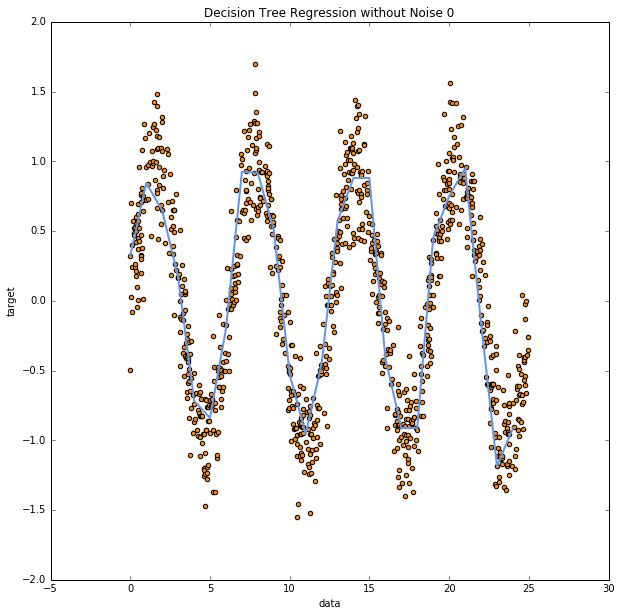

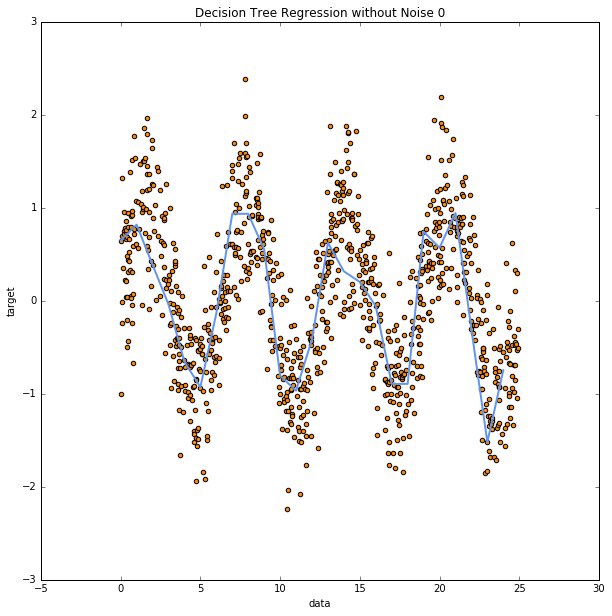

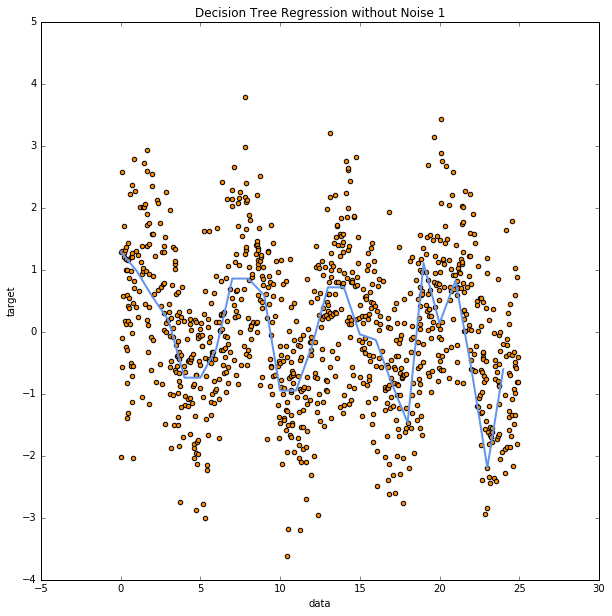

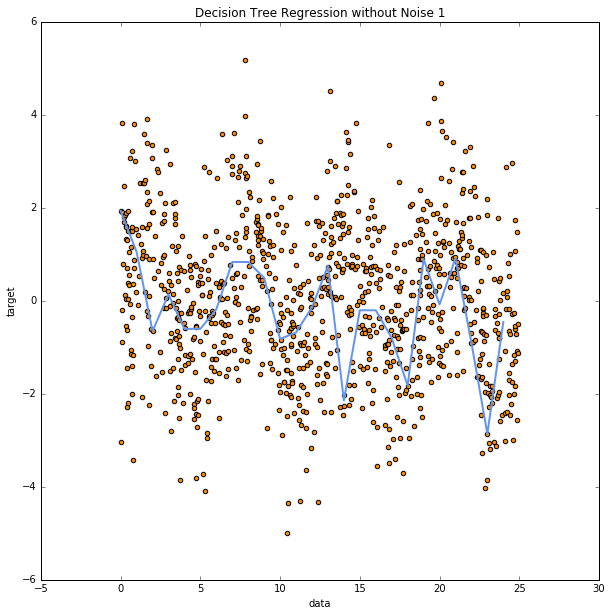

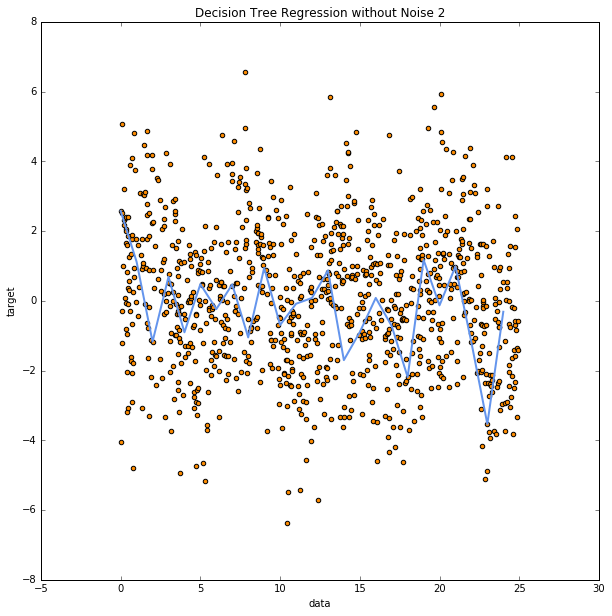

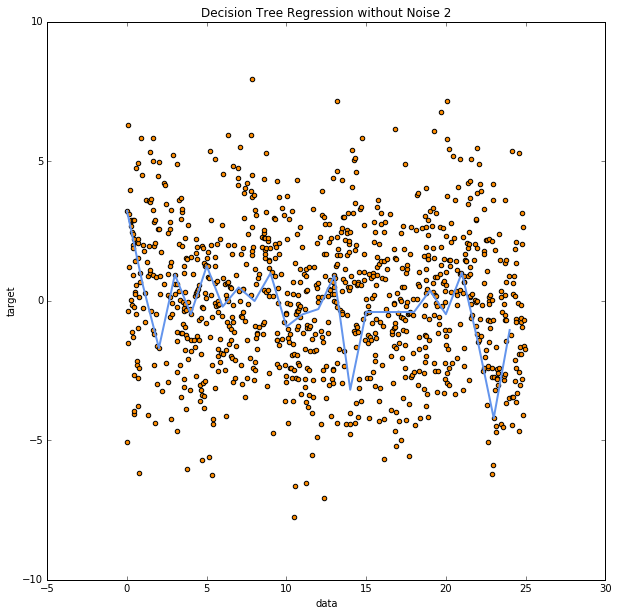

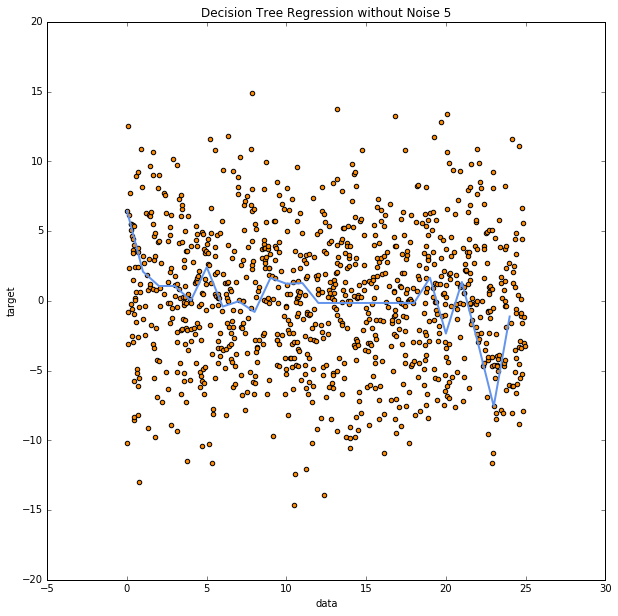

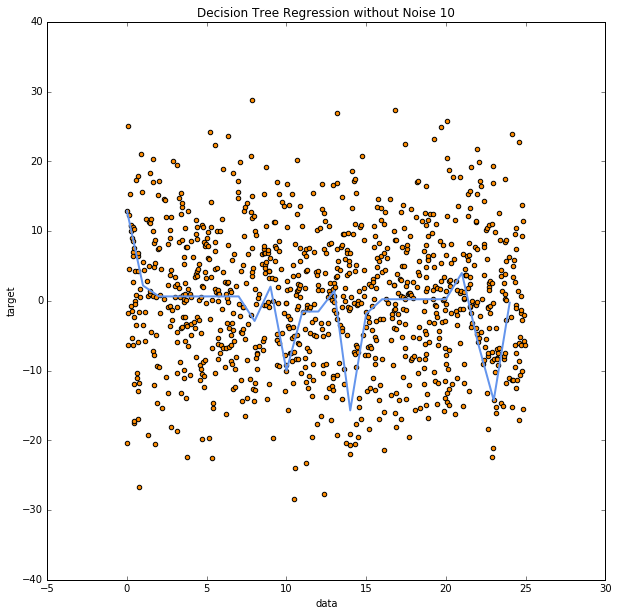

In [389]:
for noise in [0.25, 0.5, 1, 1.5, 2, 2.5, 5, 10]:
    # Create data
    np.random.seed(31430414)
    rng = np.random.RandomState(1)
    x_1 = np.sort(25 * rng.rand(1000, 1), axis=0)
    y = np.sin(x_1).ravel() + np.random.normal(0, noise, 1000)

    # Format data
    instances = np.column_stack((x_1, y))

    # Train decision trees
    clf = tree.DecisionTreeRegressor(max_depth=10, min_samples_leaf=1)
    clf.fit(instances[:, :-1], instances[:, -1])
    X_test = np.array([[i] for i in np.arange(0, max(x_1))])
    y_1 = clf.predict(X_test)
    
    # Graph the learned tree
    plt.figure(figsize=(10,10))
    plt.scatter(instances[:, :-1], instances[:, -1], c="darkorange", label="data")
    plt.plot(X_test, y_1, color="cornflowerblue", linewidth=2)
    plt.xlabel("data")
    plt.ylabel("target")
    plt.title("Decision Tree Regression without Noise %d" % noise)
    plt.show()

Performance really drops around noise with standard deviation of 5, but parts of the sin signal are still picked up at a standard deviation of 10, even though the original data has lost all its sin shape.

** Problem 3**

Calculate the generalization error (10 fold cross validation) on one of your messier models from Problem 1 (categorical and numeric features, unknowns, heterogeneous leaves). Do the same for a Random Forest. Compare your results.

For this experiment, I want to use the data that I used for the axis-parallel experiment earlier with the clusters closer together, more noise, and unknown attributes.

x_1 = N(cluster center, 0.7) - x_3
x_2 = N(cluster center, 0,7) - x_3
x_3 = Uniform(-0.1, 0.1)
where data instances get the correct cluster label 98% of the time and a random label otherwise. The models are trained without x_3.

Decision tree cross-validation accuracy: 0.607000


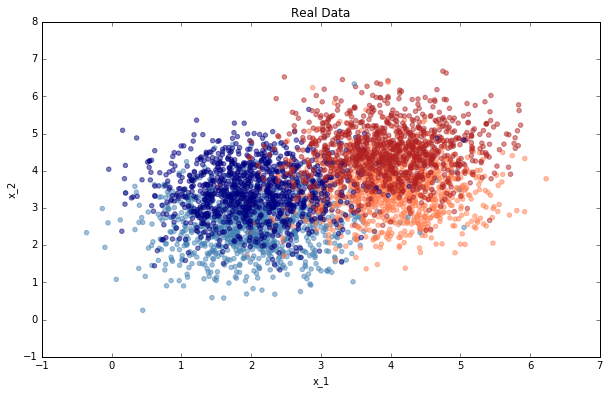

In [390]:
# Create data with 4 clusters
py_random.seed(3126000)
np_random.seed(3126000)
centers_x1 = [1, 2, 1, 2]
centers_x2 = [1.5, 1.5, 2.5, 2.5]
x_1 = []
x_2 = []
cluster = 1
colors = []
labels = []
x_3 = np.random.uniform(-0.1, 0.1, 4000)
for center_x1, center_x2 in zip(centers_x1, centers_x2):
    new_x_1 = center_x1 + np.random.normal(center_x1, 0.7, 1000)
    new_x_2 = center_x2 + np.random.normal(center_x1, 0.7, 1000)
    x_1.extend(new_x_1)
    x_2.extend(new_x_2)
    for point in zip(new_x_1, new_x_2):
        if np.random.uniform(0,1) <=  0.98:
            if cluster == 1:
                colors.append('steelblue')
                labels.append(1)
            elif cluster == 2:
                colors.append('coral')
                labels.append(2)
            elif cluster == 3:
                colors.append('navy')
                labels.append(3)
            else:
                colors.append('firebrick')
                labels.append(4)
        else:
            choices = ['steelblue', 'coral', 'navy', 'firebrick']
            choice = np.random.choice(choices)
            colors.append(choice)
            labels.append(choices.index(choice) + 1)
    cluster += 1
x_1 = np.array(x_1 - x_3)
x_2 = np.array(x_2 - x_3)
labels = np.array(labels)
instances = np.column_stack((x_1.T, x_2.T, labels.T))

# Graph the original data
figure = plt.figure(figsize=(10,6))
axes = figure.add_subplot(1, 1, 1)
axes.scatter(x_1, x_2, alpha=0.5, color=colors)
axes.set_xlabel("x_1")
axes.set_ylabel("x_2")
axes.set_title("Real Data")

# Train the tree
errors = []
for rd in xrange(3):
    generalization_error = []
    np.random.shuffle(instances)
    kf = KFold(1000, n_folds=10)
    for train, test in kf:
        # Learn linear regression model
        model = tree.DecisionTreeClassifier()
        model.fit(instances[train, :-1], instances[train, -1])
        predictions = model.predict(instances[test, :-1])
        # Calculate number of correct predictions
        error = sum(predictions == instances[test, -1]) / len(predictions)
        generalization_error.append(error)
    errors.append(np.mean(generalization_error))

print "Decision tree cross-validation accuracy: %f" % (np.mean(errors))

Now let's create and run 10-fold cross validation using a random forest:

In [391]:
# Train the forest
errors = []
for rd in xrange(3):
    generalization_error = []
    np.random.shuffle(instances)
    kf = KFold(1000, n_folds=10)
    for train, test in kf:
        # Learn linear regression model
        model = RandomForestClassifier(random_state=3126000)
        model.fit(instances[train, :-1], instances[train, -1])
        predictions = model.predict(instances[test, :-1])
        # Calculate number of correct predictions
        error = sum(predictions == instances[test, -1]) / len(predictions)
        generalization_error.append(error)
    errors.append(np.mean(generalization_error))

print "Random forest cross-validation accuracy: %f" % (np.mean(errors))

Random forest cross-validation accuracy: 0.641000


The random forest outperforms the single decision tree by about 6%, which isn't bad considering how messy the original data is.

So we can work with more than just two attributes, let's run the same experiment on the soccer dataset from problem 1.

In [392]:
# Create data
np.random.seed(314)
py_random.seed(314)

# Leaf-most leaf node
instances = list()
for idx in xrange(9):
    # 'Promoted' = true, 'Set positions' = true
    instance = [1, 1]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,3,2))
    instance.extend(np.random.randint(0,2,1))
    # Set class label, 0 = bottom half of the table, 1 = top
    if idx < 7:
        instance.append(0)
    else:
        instance.append(1)
    instances.append(instance)
    
# Next leaf node to the right
for idx in xrange(5):
    # 'Promoted' = true, 'Set positions' = false, 'Build Up' = Fast
    instance = [1, 0, 2]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,3,1))
    instance.extend(np.random.randint(0,2,1))
    # Set class label, 0 = bottom half of the table, 1 = top
    instance.append(1)
    instances.append(instance)
    
# Next leaf node to the right
for idx in xrange(4):
    # 'Promoted' = true, 'Set positions' = false, 'Build Up' = Medium
    instance = [1, 0, 1]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,3,1))
    instance.extend(np.random.randint(0,2,1))
    # Set class label, 0 = bottom half of the table, 1 = top
    if idx < 2:
        instance.append(1)
    else:
        instance.append(0)
    instances.append(instance)
    
# Next leaf node to the right
for idx in xrange(4):
    # 'Promoted' = true, 'Set positions' = false, 'Build Up' = Slow
    instance = [1, 0, 0]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,3,1))
    instance.extend(np.random.randint(0,2,1))
    # Set class label, 0 = bottom half of the table, 1 = top
    instance.append(0)
    instances.append(instance)
    
# Next leaf node to the right
for idx in xrange(4):
    # 'Promoted' = false, 'Defensive Press' = High
    instance = [0]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,2,1))
    instance.extend(np.random.randint(0,3,1))
    instance.append(2)
    instance.extend(np.random.randint(0,2,1))
    # Set class label, 0 = bottom half of the table, 1 = top
    instance.append(1)
    instances.append(instance)
    
# Next leaf node to the right
for idx in xrange(4):
    # 'Promoted' = false, 'Defensive Press' = Medium
    instance = [0]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,2,1))
    instance.extend(np.random.randint(0,3,1))
    instance.append(1)
    instance.extend(np.random.randint(0,2,1))
    # Set class label, 0 = bottom half of the table, 1 = top
    if idx < 1:
        instance.append(1)
    else:
        instance.append(0)
    instances.append(instance)

# Next leaf node to the right
for idx in xrange(4):
    # 'Promoted' = false, 'Defensive Press' = Low
    instance = [0]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,2,1))
    instance.extend(np.random.randint(0,3,1))
    instance.append(0)
    instance.append(1)
    # Set class label, 0 = bottom half of the table, 1 = top
    instance.append(0)
    instances.append(instance)
    
# Next leaf node to the right
for idx in xrange(4):
    # 'Promoted' = false, 'Defensive Press' = Low
    instance = [0]
    # Generate random values for the rest of the attributes
    instance.extend(np.random.randint(0,2,1))
    instance.extend(np.random.randint(0,3,1))
    instance.append(0)
    instance.append(0)
    # Set class label, 0 = bottom half of the table, 1 = top
    if idx < 2:
        instance.append(0)
    else:
        instance.append(1)
    instances.append(instance)
instances = np.array(instances)

# Train the tree
errors = []
for rd in xrange(3):
    generalization_error = []
    np.random.shuffle(instances)
    kf = KFold(38, n_folds=10)
    for train, test in kf:
        # Learn linear regression model
        model = tree.DecisionTreeClassifier()
        model.fit(instances[train, :-1], instances[train, -1])
        predictions = model.predict(instances[test, :-1])
        # Calculate number of correct predictions
        error = sum(predictions == instances[test, -1]) / len(predictions)
        generalization_error.append(error)
    errors.append(np.mean(generalization_error))

print "Decision tree cross-validation accuracy: %f" % (np.mean(errors))

Decision tree cross-validation accuracy: 0.641667


In [393]:
# Train the forest
errors = []
for rd in xrange(3):
    generalization_error = []
    np.random.shuffle(instances)
    kf = KFold(38, n_folds=10)
    for train, test in kf:
        # Learn linear regression model
        model = RandomForestClassifier(random_state=3126000)
        model.fit(instances[train, :-1], instances[train, -1])
        predictions = model.predict(instances[test, :-1])
        # Calculate number of correct predictions
        error = sum(predictions == instances[test, -1]) / len(predictions)
        generalization_error.append(error)
    errors.append(np.mean(generalization_error))

print "Random forest cross-validation accuracy: %f" % (np.mean(errors))


Random forest cross-validation accuracy: 0.666667


With the soccer data set, performance gains were a little bigger, but still not huge. In general, I'd expect random forest performance to be better than a single decision tree because, as we saw through this notebook, it is hard to keep a single tree from overfitting. On the other hand, using a forest of trees, raising the question of how to tune each tree (or even whether this is a good idea).